# EN3160 Assignment 1 on Intensity Transformations and Neighborhood Filtering

Instructed by Dr. Ranga Rodrigo

Done by: Warren Jayakumar

### Import Required Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

In [2]:
ASSET_FOLDER = 'a1images/'

### Implementing an Intensity Transformation Function

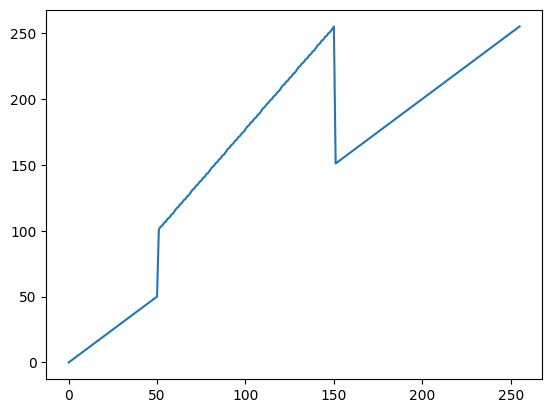

In [3]:
# Create the Function
discontinuities = np.array([(50, 50), (50, 100), (150, 255), (150, 150), (255, 255)])

# Segment-wise interpolation
t1 = np.linspace(0, discontinuities[0,1], discontinuities[0,0] + 1 - 0).astype('uint8')
t2 = np.linspace(discontinuities[0,1], discontinuities[1,1], discontinuities[1,0] - discontinuities[0,0] + 1).astype('uint8')
t3 = np.linspace(discontinuities[1,1], discontinuities[2,1], discontinuities[2,0] - discontinuities[1,0] + 1).astype('uint8')
t4 = np.linspace(discontinuities[2,1], discontinuities[3,1], discontinuities[3,0] - discontinuities[2,0] + 1).astype('uint8')
t5 = np.linspace(discontinuities[3,1], discontinuities[4,1], discontinuities[4,0] - discontinuities[3,0] + 1).astype('uint8')

# Concatenate all the segments
transform = np.concatenate([t1, t2[1:], t3[1:], t4[1:], t5[1:]])

plt.plot(transform)
plt.show()

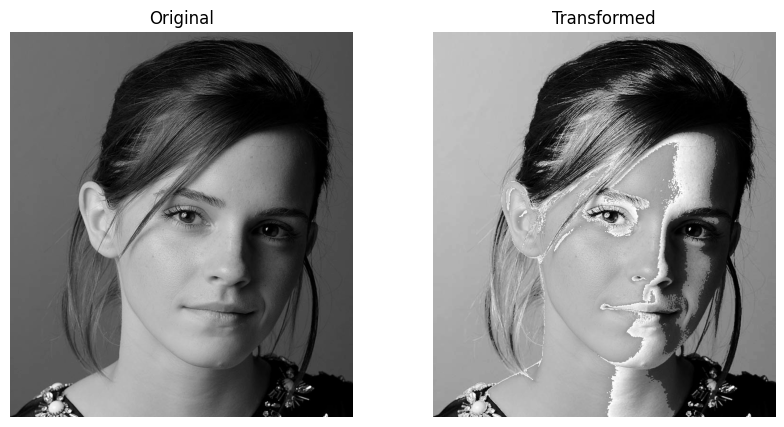

In [4]:
## Apply the transformation to the image
emma_watson = cv.imread(ASSET_FOLDER + 'emma.jpg', cv.IMREAD_GRAYSCALE)
emma_watson_transformed = cv.LUT(emma_watson, transform)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(emma_watson, cmap='gray')
axes[0].set_title('Original')
axes[0].axis('off')
axes[1].imshow(emma_watson_transformed, cmap='gray')
axes[1].set_title('Transformed')
axes[1].axis('off')
plt.show()

### Enhancing White Matter and Grey Matter in an Image

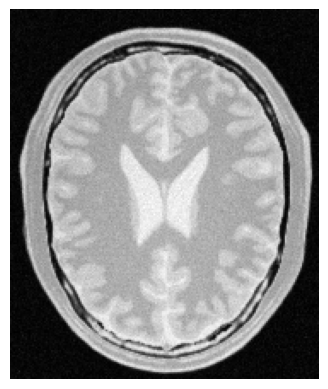

In [5]:
# View the original image
brain_image = ASSET_FOLDER + 'brain_proton_density_slice.png'
brain = cv.imread(brain_image, cv.IMREAD_GRAYSCALE)
plt.imshow(brain, cmap='gray')
plt.axis(False)
plt.show()

The white matter is brighter than the surrounding areas. Therefore, in order to enhance these areas, more detail can be brought out by increasing contrast in the brighter areas of the image. When considering the greymatter, it is darker than the white matter. Therefore, in order to enhance these areas, more detail can be brought out by increasing contrast in the medium intensity areas of the image.

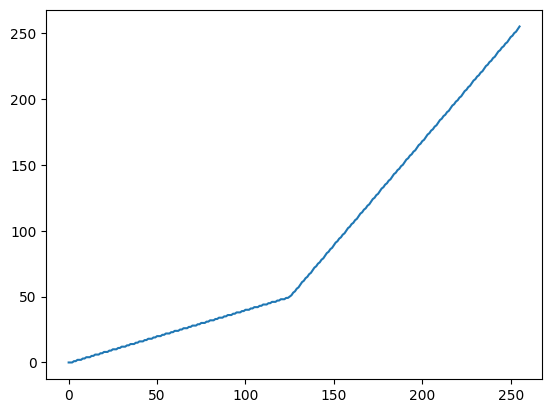

In [6]:
# Create the Function
discontinuities = np.array([(125, 50), (255,255)])

# Segment-wise interpolation
t1 = np.linspace(0, discontinuities[0,1], discontinuities[0,0] + 1 - 0).astype('uint8')
t2 = np.linspace(discontinuities[0,1], discontinuities[1,1], discontinuities[1,0] - discontinuities[0,0] + 1).astype('uint8')

# Concatenate all the segments
white_transform = np.concatenate([t1, t2[1:]])
plt.plot(white_transform)
plt.show()

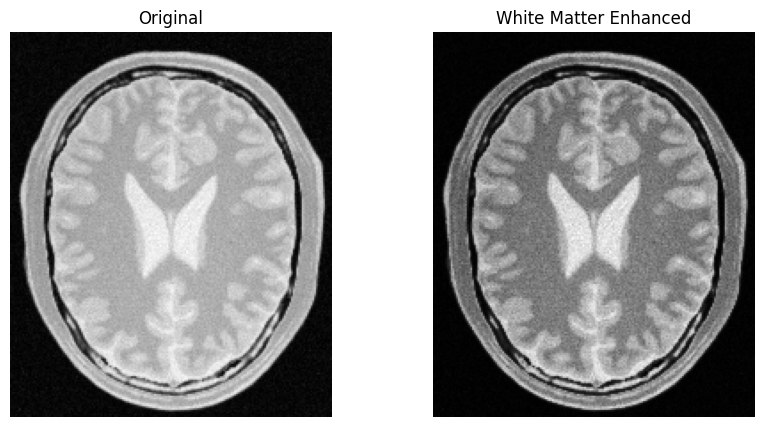

In [7]:
whitematter_enhanced = cv.LUT(brain, white_transform)
plot, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(brain, cmap='gray')
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(whitematter_enhanced, cmap='gray')
axes[1].set_title('White Matter Enhanced')
axes[1].axis(False)
plt.show()

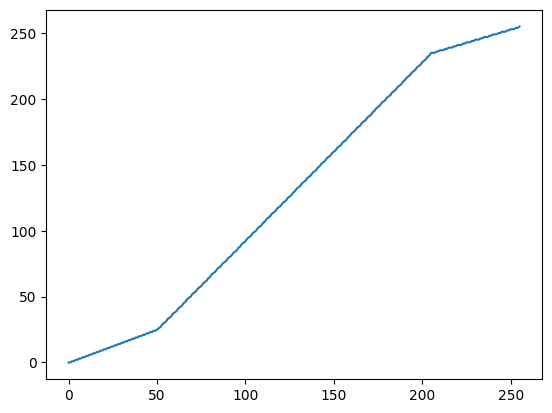

In [8]:
# Create the Function
discontinuities = np.array([(50, 25), (205,235), (255,255)])

# Segment-wise interpolation
t1 = np.linspace(0, discontinuities[0,1], discontinuities[0,0] + 1 - 0).astype('uint8')
t2 = np.linspace(discontinuities[0,1], discontinuities[1,1], discontinuities[1,0] - discontinuities[0,0] + 1).astype('uint8')
t3 = np.linspace(discontinuities[1,1], discontinuities[2,1], discontinuities[2,0] - discontinuities[1,0] + 1).astype('uint8')

# Concatenate all the segments
grey_transform = np.concatenate([t1, t2[1:], t3[1:]])
plt.plot(grey_transform)
plt.show()

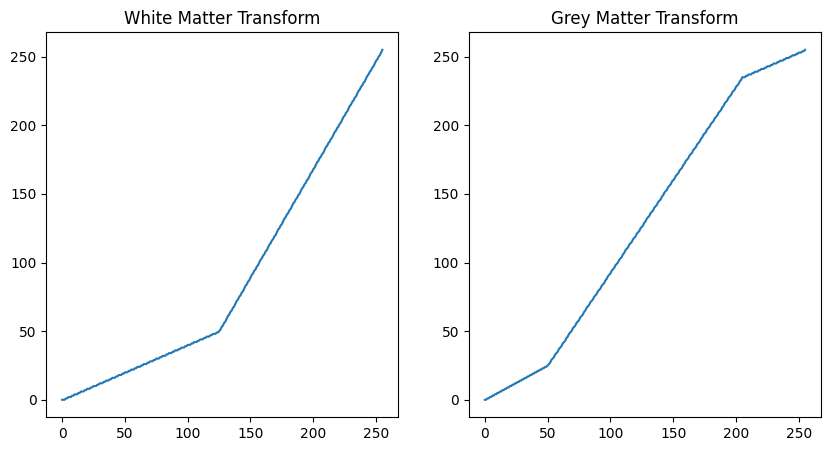

In [9]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].plot(white_transform)
axes[0].set_title('White Matter Transform')
axes[1].plot(grey_transform)
axes[1].set_title('Grey Matter Transform')
plt.show()

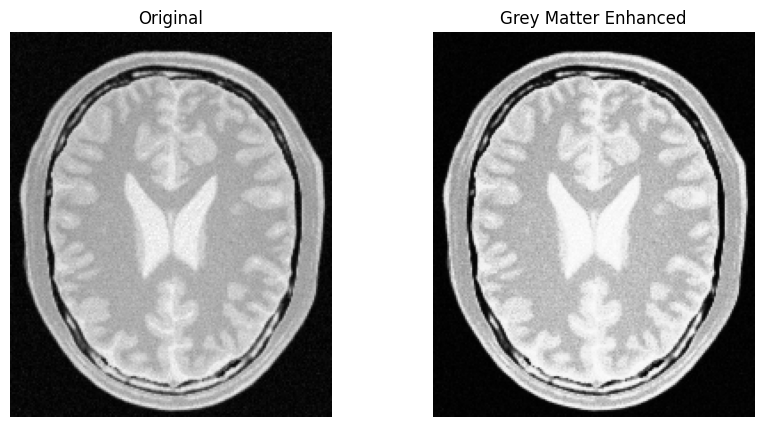

In [10]:
grey_matter_enhanced = cv.LUT(brain, grey_transform)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(brain, cmap='gray')
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(grey_matter_enhanced, cmap='gray')
axes[1].set_title('Grey Matter Enhanced')
axes[1].axis(False)
plt.show()

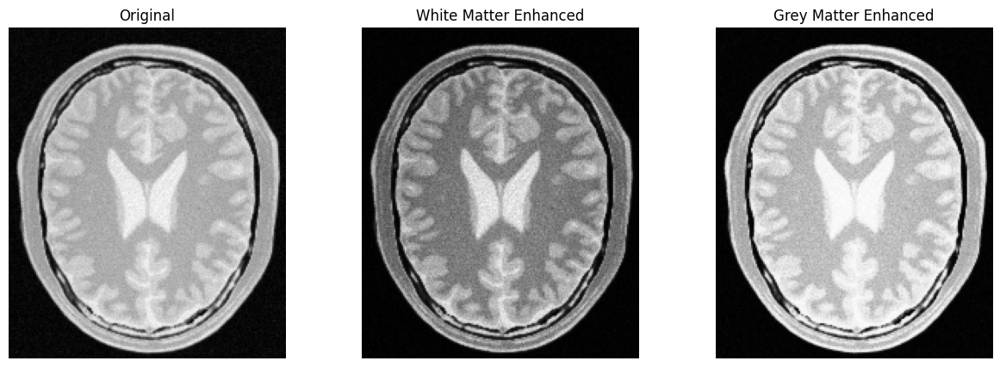

In [11]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(brain, cmap='gray')
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(whitematter_enhanced, cmap='gray')
axes[1].set_title('White Matter Enhanced')
axes[1].axis(False)
axes[2].imshow(grey_matter_enhanced, cmap='gray')
axes[2].set_title('Grey Matter Enhanced')
axes[2].axis(False)
plt.show()

### Gamma Correction

In this section, we consider an image in the L,A,B colour space and gamma correct the L channel. In order to ontain a suitable $\gamma$ value, we will plot the histogram of the L channel and determine a value for $\gamma$

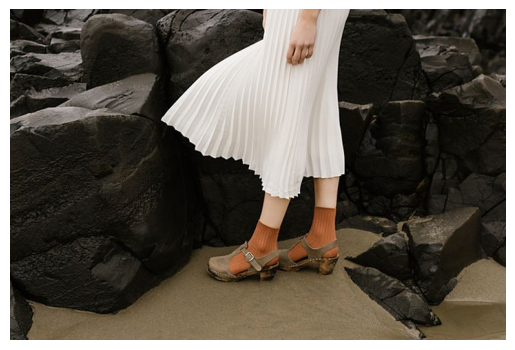

In [12]:
# View the image
gamma_image = ASSET_FOLDER + 'highlights_and_shadows.jpg'
gamma_image = cv.imread(gamma_image)
plt.imshow(cv.cvtColor(gamma_image, cv.COLOR_BGR2RGB))
plt.axis(False)
plt.show()

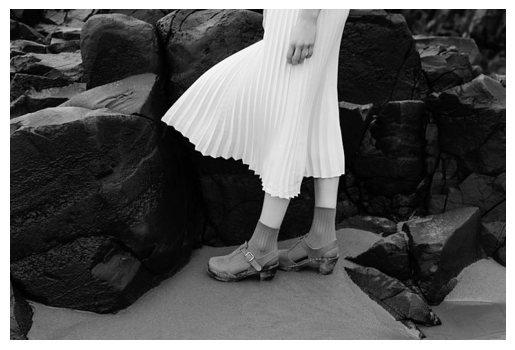

In [13]:
# View the L channel
lab_image = cv.cvtColor(gamma_image, cv.COLOR_BGR2LAB)
l, a, b = cv.split(lab_image)
plt.imshow(l, cmap='gray')
plt.axis(False)
plt.show()

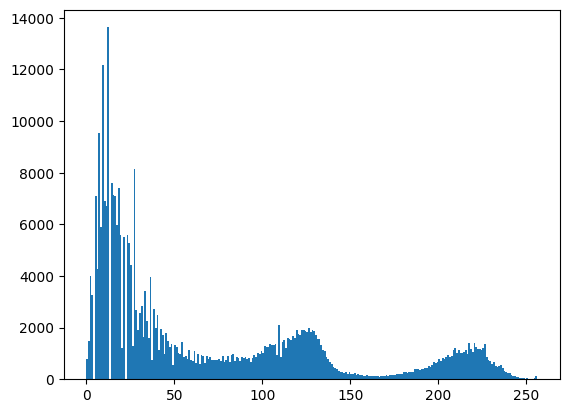

In [14]:
# View the histogram
plt.hist(l.ravel(), bins=256, range=[0, 256])
plt.show()

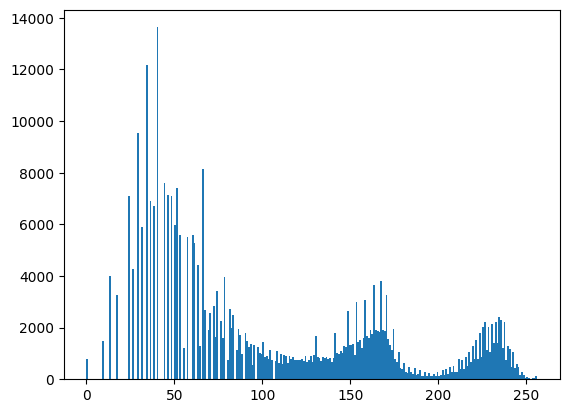

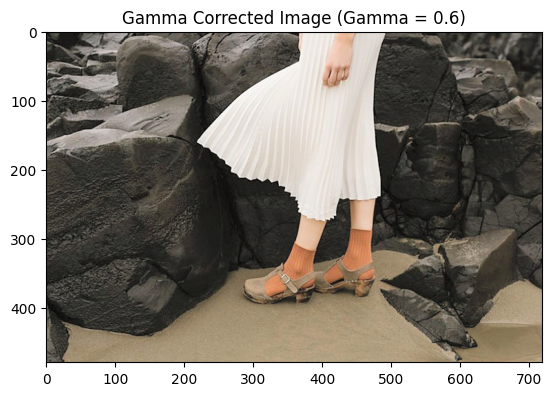

In [15]:
# Since most values of L channel are concentrated in the lower range, we can apply gamma correction to enhance the image such that gamma is less than 1
gamma = 0.6
gamma_transform = np.array([(i / 255.0) ** gamma * 255 for i in np.arange(0,256)], dtype = np.uint8)
l_gamma_corrected = cv.LUT(l, gamma_transform)

# Merge back the corrected L channel with original A and B channels
lab_corrected = cv.merge([l_gamma_corrected, a, b])
plt.hist(l_gamma_corrected.ravel(), bins=256, range=[0, 256])
plt.show()

# Convert back to BGR (or RGB)
image_corrected = cv.cvtColor(lab_corrected, cv.COLOR_LAB2BGR)
plt.imshow(cv.cvtColor(image_corrected, cv.COLOR_BGR2RGB))
plt.title(f'Gamma Corrected Image (Gamma = {gamma})')
plt.show()

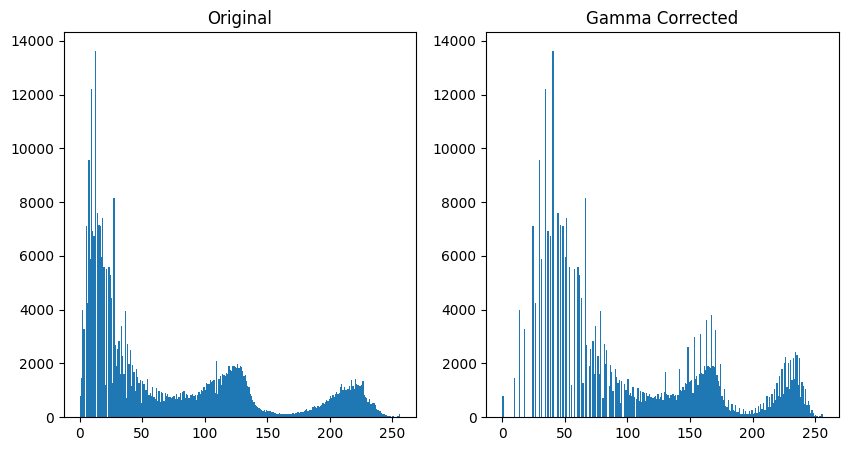

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].hist(l.ravel(), bins=256, range=[0, 256])
axes[0].set_title('Original')
axes[1].hist(l_gamma_corrected.ravel(), bins=256, range=[0, 256])
axes[1].set_title('Gamma Corrected')
plt.show()

### Vibrance Enhancement

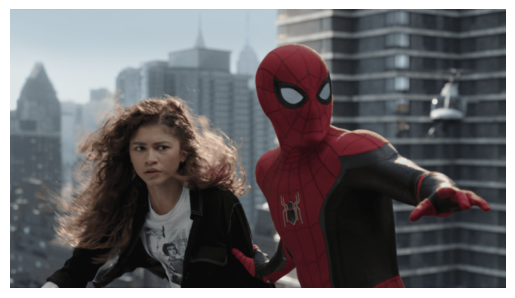

In [17]:
vibrance_image = ASSET_FOLDER + 'spider.png'
vibrance_image = cv.imread(vibrance_image)
plt.imshow(cv.cvtColor(vibrance_image, cv.COLOR_BGR2RGB))
plt.axis(False)
plt.show()

In [18]:
h,s,v = cv.split(cv.cvtColor(vibrance_image, cv.COLOR_BGR2HSV))

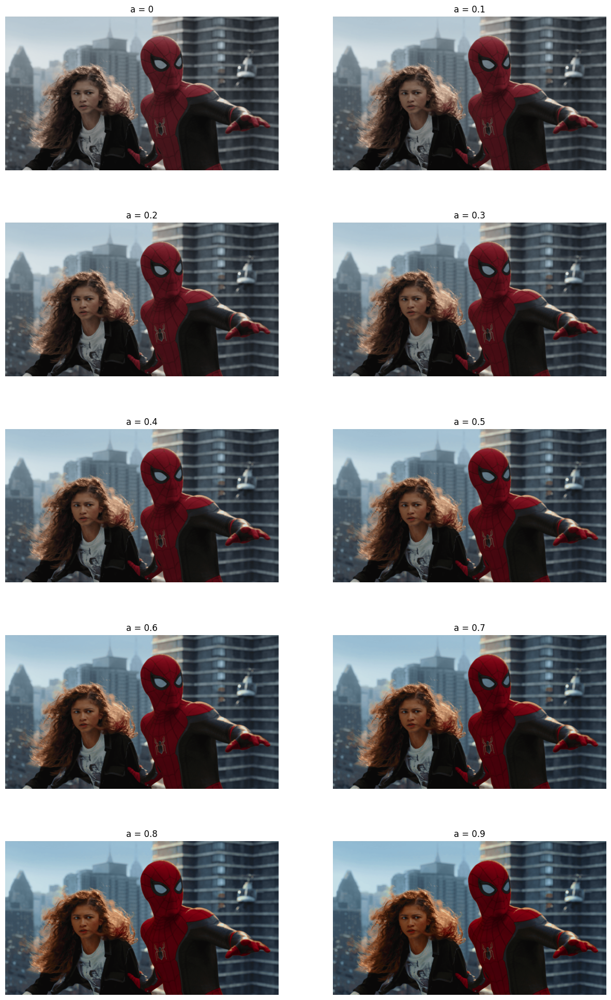

In [19]:
a_values = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0] # a = 0 is the original image
fig, axes = plt.subplots(5, 2, figsize=(15, 25))
for i, ax in enumerate(axes.flatten()):
    vibrance_adjustment = np.array(
        [min(255, x + a_values[i] * 128 * np.exp(-(x - 128)**2 / (2 * 70**2))) for x in np.arange(0, 256)],
        dtype=np.uint8
    )
    s_vibrance = cv.LUT(s, vibrance_adjustment)
    adjusted_image = cv.merge([h, s_vibrance, v])
    ax.imshow(cv.cvtColor(adjusted_image, cv.COLOR_HSV2RGB))
    ax.set_title(f'a = {a_values[i]}')
    ax.axis(False)
plt.show()

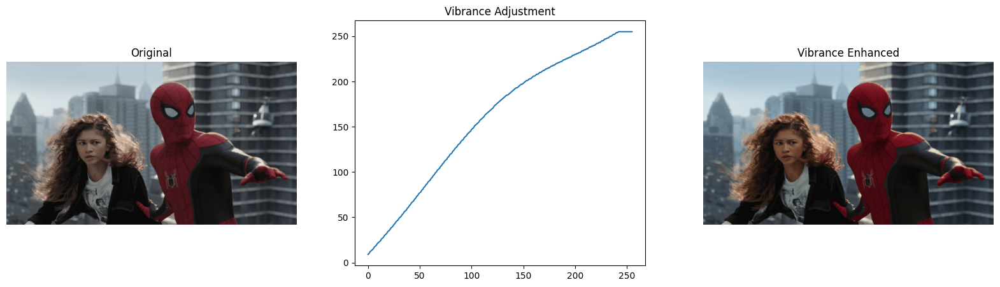

In [20]:
# a = 0.4 seems to be the best value for vibrance enhancement. Let's use this value to enhance the vibrance of the image.
a = 0.4
vibrance_adjustment = np.array(
        [min(255, x + a * 128 * np.exp(-(x - 128)**2 / (2 * 70**2))) for x in np.arange(0, 256)],
        dtype=np.uint8
    )

s_vibrance = cv.LUT(s, vibrance_adjustment)
adjusted_image = cv.merge([h, s_vibrance, v])
plot, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(cv.cvtColor(vibrance_image, cv.COLOR_BGR2RGB))
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].plot(vibrance_adjustment)
axes[1].set_title('Vibrance Adjustment')
axes[2].imshow(cv.cvtColor(adjusted_image, cv.COLOR_HSV2RGB))
axes[2].set_title('Vibrance Enhanced')
axes[2].axis(False)
plt.show()


### Histogram Equalization

In [36]:
def histogram_equalization(image):
    M, N = image.shape
    h = cv.calcHist([image], [0], None, [256], [0, 256]).flatten()
    cdf = np.cumsum(h)  # Cumulative Distribution Function
    cdf_normalized = cdf * (255 / cdf[-1])  # Normalize CDF to range [0, 255]
    t = np.uint8(cdf_normalized)  # Convert to uint8
    g = t[image]  # Map the original image through the normalized CDF
    return g

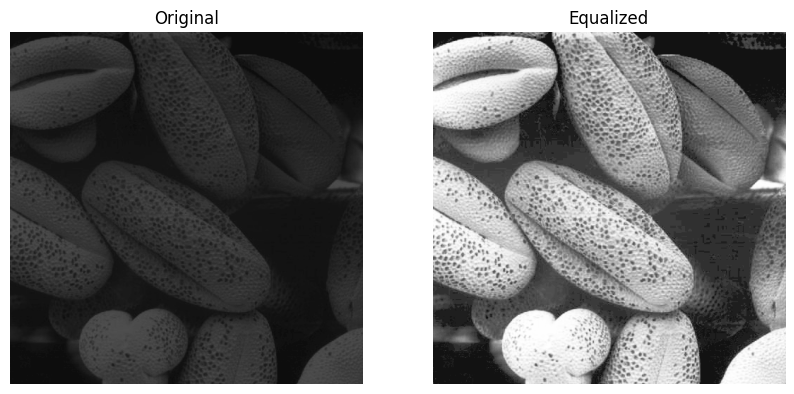

In [41]:
histogram_equalization_image = ASSET_FOLDER + 'shells.tif'
histogram_equalization_image = cv.imread(histogram_equalization_image, cv.IMREAD_GRAYSCALE)
euqalized_image = histogram_equalization(histogram_equalization_image)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(histogram_equalization_image, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(euqalized_image, cmap='gray', vmin=0, vmax=255)
axes[1].set_title('Equalized')
axes[1].axis(False)
plt.show()

### Histogram Equalization on Foreground

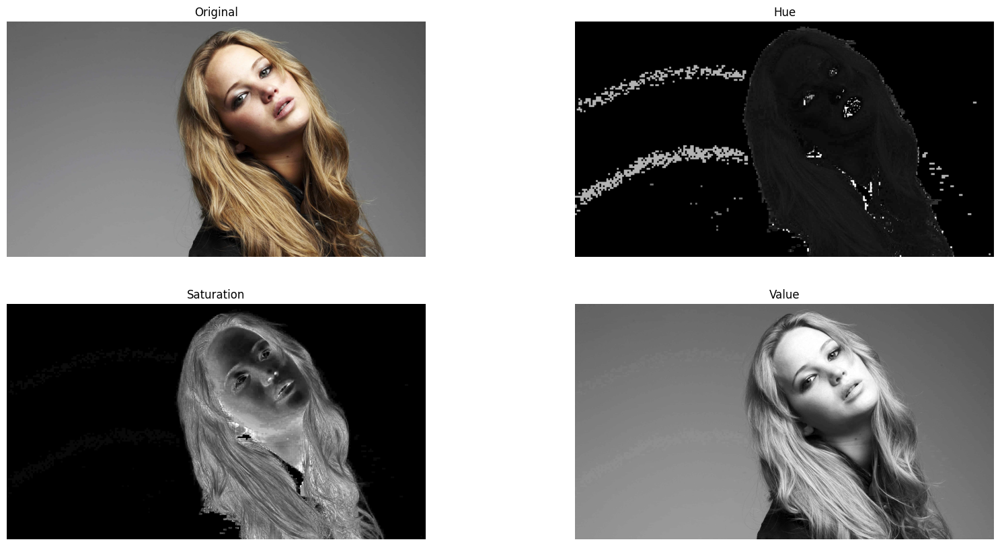

In [96]:
jeniffer = ASSET_FOLDER + 'jeniffer.jpg'
histogram_foreground = cv.imread(jeniffer)
h,s,v = cv.split(cv.cvtColor(histogram_foreground, cv.COLOR_BGR2HSV))
fig, axes = plt.subplots(2,2, figsize=(20, 10))
axes[0,0].imshow(cv.cvtColor(histogram_foreground, cv.COLOR_BGR2RGB))
axes[0,0].set_title('Original')
axes[0,0].axis(False)
axes[0,1].imshow(h, cmap='gray')
axes[0,1].set_title('Hue')
axes[0,1].axis(False)
axes[1,0].imshow(s, cmap='gray')
axes[1,0].set_title('Saturation')
axes[1,0].axis(False)
axes[1,1].imshow(v, cmap='gray')
axes[1,1].set_title('Value')
axes[1,1].axis(False)
plt.show()

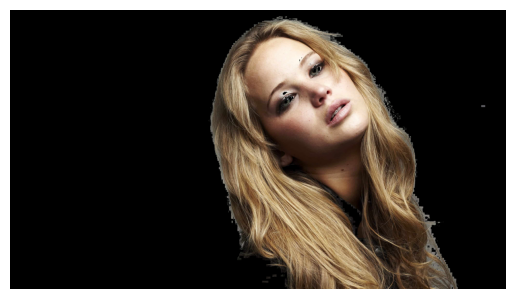

In [97]:
_, binary_mask = cv.threshold(s, 11, 255, cv.THRESH_BINARY)
foreground = cv.bitwise_and(histogram_foreground, histogram_foreground, mask=binary_mask)
plt.imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
plt.axis(False)
plt.show()

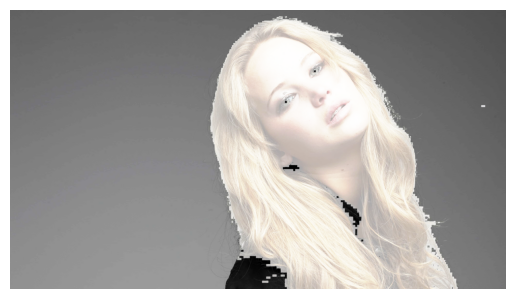

In [98]:
h = cv.calcHist([foreground], [0], None, [256], [0, 256]).flatten()
cdf = np.cumsum(h)
cdf_normalized = cdf * (255 / cdf[-1]) 
t = np.uint8(cdf_normalized) 
equalized_foreground  = t[foreground]
equalized_image = histogram_foreground.copy()

# Step 7: Replace the foreground pixels in the output image with the equalized ones
equalized_image[binary_mask != 0] = equalized_foreground[binary_mask != 0]
plt.imshow(cv.cvtColor(equalized_image, cv.COLOR_BGR2RGB))
plt.axis(False)
plt.show()

### Sobel Filtering

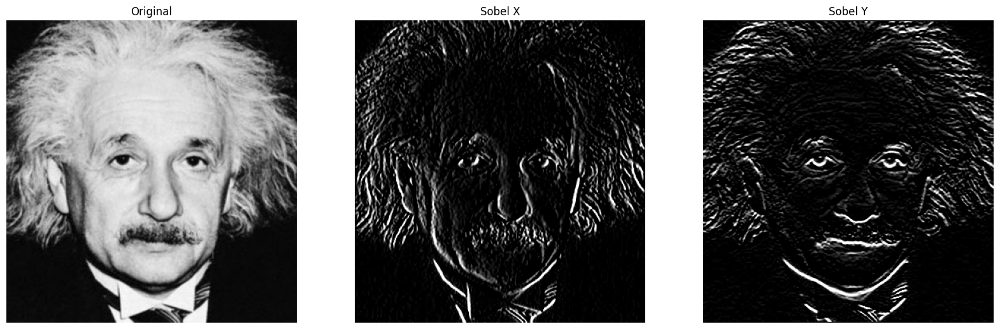

In [111]:
einstein = ASSET_FOLDER + 'einstein.png'
einstein = cv.imread(einstein, cv.IMREAD_GRAYSCALE)
sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
sobel_einstein_x = cv.filter2D(einstein, -1, sobel_x)
sobel_einstein_y = cv.filter2D(einstein, -1, sobel_y)
fig, axes = plt.subplots(1, 3, figsize=(20, 10))
axes[0].imshow(einstein, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(sobel_einstein_x, cmap='gray', vmin=0, vmax=255)
axes[1].set_title('Sobel X')
axes[1].axis(False)
axes[2].imshow(sobel_einstein_y, cmap='gray', vmin=0, vmax=255)
axes[2].set_title('Sobel Y')
axes[2].axis(False)
plt.show()

C:\Users\warre\AppData\Local\Temp\ipykernel_27268\3675175327.py:8: RuntimeWarning: overflow encountered in scalar subtract
  sobel_einstein_x[i,j] = einstein[i-1,j-1] - einstein[i-1,j+1] + 2*einstein[i,j-1] - 2*einstein[i,j+1] + einstein[i+1,j-1] - einstein[i+1,j+1]


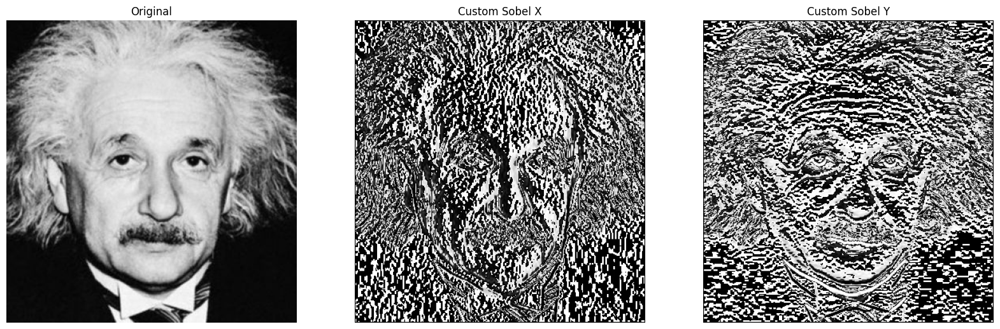

In [140]:
M,N = einstein.shape
sobel_einstein_x = np.zeros(shape = (M,N), dtype = np.int16)
sobel_einstein_y = np.zeros(shape = (M,N), dtype = np.int16)

# Custom Sobel filtering
for i in range(1, M-1):
    for j in range(1, N-1):
        sobel_einstein_x[i,j] = einstein[i-1,j-1] - einstein[i-1,j+1] + 2*einstein[i,j-1] - 2*einstein[i,j+1] + einstein[i+1,j-1] - einstein[i+1,j+1]
        sobel_einstein_y[i,j] = einstein[i-1,j-1] + 2*einstein[i-1,j] + einstein[i-1,j+1] - einstein[i+1,j-1] - 2*einstein[i+1,j] - einstein[i+1,j+1]

sobel_einstein_x = np.clip(sobel_einstein_x, -255, 255)
sobel_einstein_y = np.clip(sobel_einstein_y, -255, 255)

# Step 2: Normalize the gradient values to the range [0, 255] to handle signed values
# Shift the values from [-255, 255] to [0, 255]
sobel_einstein_x_normalized = np.uint8(255*(sobel_einstein_x + 255) / 510)
sobel_einstein_y_normalized = np.uint8(255*(sobel_einstein_y + 255) / 510)

# Assign the normalized values

fig, axes = plt.subplots(1, 3, figsize=(20, 10))
axes[0].imshow(einstein, cmap='gray', vmin=0, vmax=255)
axes[0].set_title('Original')
axes[0].axis(False)
axes[1].imshow(sobel_einstein_x_normalized, cmap='gray')
axes[1].set_title('Custom Sobel X')
axes[1].axis(False)
axes[2].imshow(sobel_einstein_y_normalized, cmap='gray')
axes[2].set_title('Custom Sobel Y')
axes[2].axis(False)
plt.show()

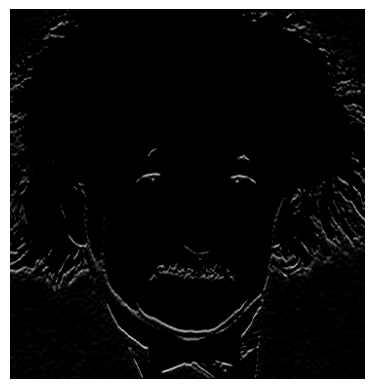

In [138]:
sobel_1 = np.array([1,2,1])
sobel_2 = np.array([1,0,-1])
sobel_filtered_image = cv.filter2D(einstein, -1, sobel_1)
sobel_filtered_image = cv.filter2D(sobel_filtered_image, -1, sobel_2)
plt.imshow(sobel_filtered_image, cmap='gray', vmin=0, vmax=255)
plt.axis(False)
plt.show()

(112, 200)
(448, 800)


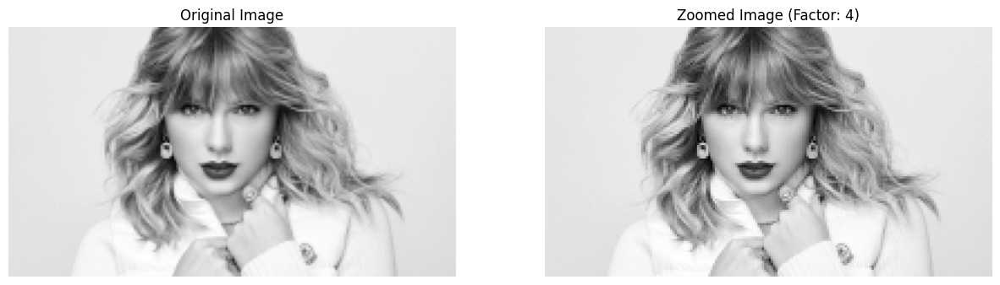

In [153]:
def zoom_image(image, zoom_factor):
    if zoom_factor <= 0 or zoom_factor > 10:
        raise ValueError("Zoom factor must be in the range (0, 10].")
    
    M, N = image.shape[:2]
    new_M, new_N = int(M * zoom_factor), int(N * zoom_factor)
    
    zoomed_image = np.zeros((new_M, new_N), dtype=image.dtype)
    
    for i in range(new_M):
        for j in range(new_N):
            orig_i = int(i / zoom_factor)
            orig_j = int(j / zoom_factor)
            zoomed_image[i, j] = image[orig_i, orig_j]
    
    return zoomed_image
image = ASSET_FOLDER + 'a1q5images/taylor_small.jpg'
# Read the image
image = cv.imread(image, cv.IMREAD_GRAYSCALE)

# Define the zoom factor
zoom_factor = 4  # Change this value as needed

# Zoom the image
zoomed_image = zoom_image(image, zoom_factor)
print(image.shape)
print(zoomed_image.shape)
# Visualize the original and zoomed images
fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(zoomed_image, cmap='gray')
axes[1].set_title(f'Zoomed Image (Factor: {zoom_factor})')
axes[1].axis('off')
plt.show()

(112, 200)
(448, 800)


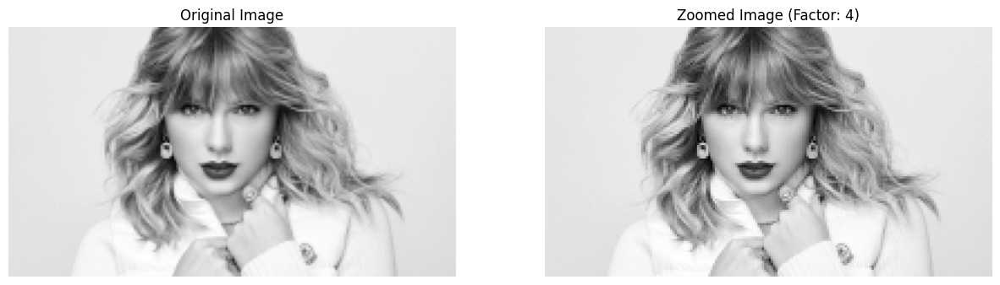

In [154]:
def zoom_image_bilinear(image, zoom_factor):
    if zoom_factor <= 0 or zoom_factor > 10:
        raise ValueError("Zoom factor must be in the range (0, 10].")
    
    M, N = image.shape[:2]
    new_M, new_N = int(M * zoom_factor), int(N * zoom_factor)
    
    zoomed_image = np.zeros((new_M, new_N), dtype=image.dtype)
    
    for i in range(new_M):
        for j in range(new_N):
            # Map back to the original image coordinates
            orig_i = i / zoom_factor
            orig_j = j / zoom_factor
            
            # Get the integer (floor) and fractional parts of the coordinates
            i_floor = int(np.floor(orig_i))
            j_floor = int(np.floor(orig_j))
            
            i_ceil = min(i_floor + 1, M - 1)
            j_ceil = min(j_floor + 1, N - 1)
            
            delta_i = orig_i - i_floor
            delta_j = orig_j - j_floor
            
            # Get the four surrounding pixel values
            top_left = image[i_floor, j_floor]
            top_right = image[i_floor, j_ceil]
            bottom_left = image[i_ceil, j_floor]
            bottom_right = image[i_ceil, j_ceil]
            
            # Interpolate in the horizontal direction (j)
            top_interp = (1 - delta_j) * top_left + delta_j * top_right
            bottom_interp = (1 - delta_j) * bottom_left + delta_j * bottom_right
            
            # Interpolate in the vertical direction (i)
            pixel_value = (1 - delta_i) * top_interp + delta_i * bottom_interp
            
            # Set the pixel value in the zoomed image
            zoomed_image[i, j] = pixel_value
    
    return zoomed_image

zoomed_image_bilinear = zoom_image_bilinear(image, zoom_factor)
print(image.shape)
print(zoomed_image.shape)
# Visualize the original and zoomed images
fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(zoomed_image, cmap='gray')
axes[1].set_title(f'Zoomed Image (Factor: {zoom_factor})')
axes[1].axis('off')
plt.show()

In [156]:
def compute_normalized_ssd(image1, image2):
    diff = (image1.astype(np.float32) - image2.astype(np.float32)) ** 2
    return np.sum(diff) / diff.size


large_image = ASSET_FOLDER + 'a1q5images/taylor.jpg'
large_image = cv.imread(large_image, cv.IMREAD_GRAYSCALE)
print(large_image.shape)
print(zoomed_image.shape)
ssd1 = compute_normalized_ssd(large_image, zoomed_image)
ssd2 = compute_normalized_ssd(large_image, zoomed_image_bilinear)
print(f"SSD (Nearest Neighbor): {ssd1:.2f}")
print(f"SSD (Bilinear): {ssd2:.2f}")

(448, 800)
(448, 800)
SSD (Nearest Neighbor): 169.87
SSD (Bilinear): 202.99


### Image Enhancement